In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('final_filtered_data.csv')
df = df.drop(df.index[0])
df

C:\Users\Kishan Bhimani\AppData\Local\Temp\ipykernel_6872\3463174060.py:1: DtypeWarning: Columns (4,14,15,16,17,90,93,94,95) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('final_filtered_data.csv')


,Key (value),session ID,Key type,respondentID,Respondent's email,Department,Status (completed/in progress),Company,Industry,Number of staff,...,What do you think should be improved in the work/processes in the company?,Do you work remotely?,Your management level:,Your work experience in the Company:,"<big>Dear colleague!<br><br>You have answered all the mandatory questions of the questionnaire.<br> In order to conduct a deeper analysis of the results, we ask you to answer a few more questions.</big>",What's your gender:,Your age:,Where do you work?,Choose your function in the Company,Please indicate your level of education
1,cff299d4-76eb-49be-a0c4-760a608bc79c,2859896.0,group,5776885.0,NaN,NaN,filled,Comp0001,IT and Internet,over 1000 people,...,Test,Remote,Specialist / worker (no subordinates),Up to six months,NaN,Male,Up to 20 years old,Moscow,Marketing,Higher education that does not coincide with t...
2,cff299d4-76eb-49be-a0c4-760a608bc79c,2860137.0,group,5777167.0,NaN,NaN,filled,Comp0001,IT and Internet,over 1000 people,...,0,Remote,Specialist / worker (no subordinates),2 to 3 years,NaN,Female,31 to 35 years old,Moscow,HR (personnel management),Higher education that does not coincide with t...
3,cff299d4-76eb-49be-a0c4-760a608bc79c,2860171.0,group,5777203.0,NaN,NaN,filled,Comp0001,IT and Internet,over 1000 people,...,0,Remote,Specialist / worker (no subordinates),2 to 3 years,NaN,Female,51 to 55 years old,Moscow,Work with external clients (including call-cen...,Higher education that does not coincide with t...
4,cff299d4-76eb-49be-a0c4-760a608bc79c,2860173.0,group,5777205.0,NaN,NaN,filled,Comp0001,IT and Internet,over 1000 people,...,.,Remote,Specialist / worker (no subordinates),3 to 5 years,NaN,Male,26 to 30 years old,Moscow,Information technology (including technical su...,Higher education that does not coincide with t...
5,cff299d4-76eb-49be-a0c4-760a608bc79c,2860180.0,group,5777212.0,NaN,NaN,filled,Comp0001,IT and Internet,over 1000 people,...,social package for employees,Office,Leader (has subordinates),2 to 3 years,NaN,Female,36 to 40 years old,Moscow,PR and GR (public relations and representation...,Higher profile (according to the current speci...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18968,e8a0233f-6e54-4939-a00d-4e9a290951c0,2936085.0,group,6004918.0,NaN,NaN,filled,Comp0052,"Telecommunications, communications",over 1000 people,...,periodic training,Office,Leader (has subordinates),From 5 years to 10 years,NaN,Male,41 to 45 years old,NaN,NaN,NaN
18969,e8a0233f-6e54-4939-a00d-4e9a290951c0,2936188.0,group,6004953.0,NaN,NaN,filled,Comp0052,"Telecommunications, communications",over 1000 people,...,training program,Office,Specialist / worker (no subordinates),Up to six months,NaN,Female,21 to 25 years old,NaN,NaN,NaN
18970,e8a0233f-6e54-4939-a00d-4e9a290951c0,2936808.0,group,6005782.0,NaN,NaN,filled,Comp0052,"Telecommunications, communications",over 1000 people,...,I find it difficult to answer.,Remote,Specialist / worker (no subordinates),3 to 5 years,NaN,Female,26 to 30 years old,NaN,NaN,NaN
18971,e8a0233f-6e54-4939-a00d-4e9a290951c0,2938335.0,group,6006488.0,NaN,NaN,filled,Comp0052,"Telecommunications, communications",over 1000 people,...,0,Office,Leader (has subordinates),From 5 years to 10 years,NaN,Female,46 to 50 years old,NaN,NaN,NaN


In [3]:
column_list = ['I am interested in the work that I do in the Company.', 
               'My work allows me to maximize my abilities.', 
               'Working in the company gives me a sense of stability and confidence in the future.']

# Get the list of all columns with trimmed white space and lowercased
all_columns = [col.strip().lower() for col in df.columns.tolist()]

# Get the index of the columns in column_list
column_indices = [all_columns.index(col.lower()) for col in column_list if col.lower() in all_columns]

print(column_indices)


[26, 27, 71]


In [4]:
df.columns

Index(['Key (value)', 'session ID', 'Key type', 'respondentID',
       'Respondent's email', 'Department', 'Status (completed/in progress)',
       'Company', 'Industry', 'Number of staff', 'start date',
       'Date of completion',
       'Fill time (Years:Months:Days:Hours:Minutes:Seconds)', 'Unnamed: 14',
       '<div class="intro-text"><b>Dear Colleague!</b><br><br> We invite you to take part in the study as part of the <b>All-Russian Monitoring of Personnel Engagement.</b><br>< br><b>The questionnaire includes questions of several types:</b><ul><li><b>Assessment of the statement:</b> To the right of each statement, mark the option that shows how much you agree with the statement.< /li> <li><b>Choose from options:</b> choose the option that seems most appropriate to you from the list. </li></ul>After answering all the questions on the page, click the "Forward" button.<br><br><b>Please be careful! After pressing the "Forward" button, it will be impossible to change the answers! </b>

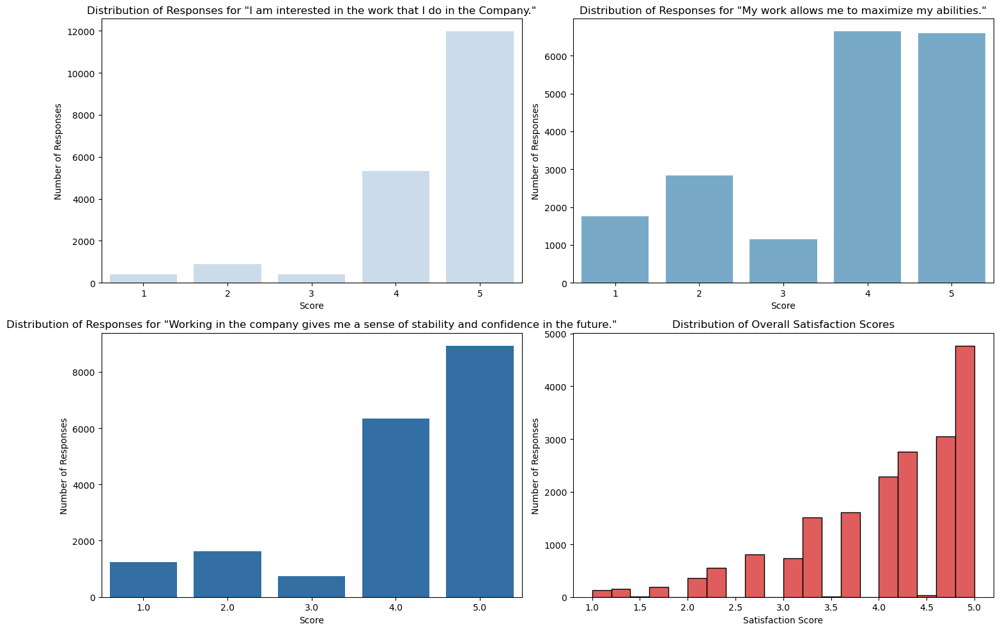

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Mapping scores to responses
response_mapping = {'Agree': 5,
                    'Rather agree than disagree': 4,
                    'Disagree rather than agree': 2,
                    'Disagree': 1,
                    'Difficult to answer': 3}
df_selected = df
# Mapping responses to scores
df_selected = df_selected.iloc[1:].replace(response_mapping)

# Calculating an overall satisfaction score
df_selected['Satisfaction Score'] = df_selected[['I am interested in the work that I do in the Company.',
                                                 'My work allows me to maximize my abilities.',
                                                 'Working in the company gives me a sense of stability and confidence in the future.']].mean(axis=1)

# Creating subplots for figures
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

# Plotting each of the columns individually
columns = ['I am interested in the work that I do in the Company.',
           'My work allows me to maximize my abilities.',
           'Working in the company gives me a sense of stability and confidence in the future.']
colors = sns.color_palette("Blues", len(columns))  # Sequential color palette

for i, column in enumerate(columns):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    sns.countplot(data=df_selected, x=column, palette=[colors[i]], ax=ax)
    ax.set_title(f'Distribution of Responses for "{column}"')
    ax.set_xlabel('Score')
    ax.set_ylabel('Number of Responses')

# Plotting the overall satisfaction score
ax = axes[1, 1]
try:
    with pd.option_context('mode.use_inf_as_na', True): 
        sns.histplot(data=df_selected, x='Satisfaction Score', bins=20, color='#d62728', ax=ax)
except:
    print("Error in creating histogram. Please make sure your pandas and seaborn packages are up-to-date.")
    pass
ax.set_title('Distribution of Overall Satisfaction Scores')
ax.set_xlabel('Satisfaction Score')
ax.set_ylabel('Number of Responses')

# Adjusting the layout and spacing
plt.tight_layout()

# Displaying the figures
plt.show()


# 1. Demographic Analysis:

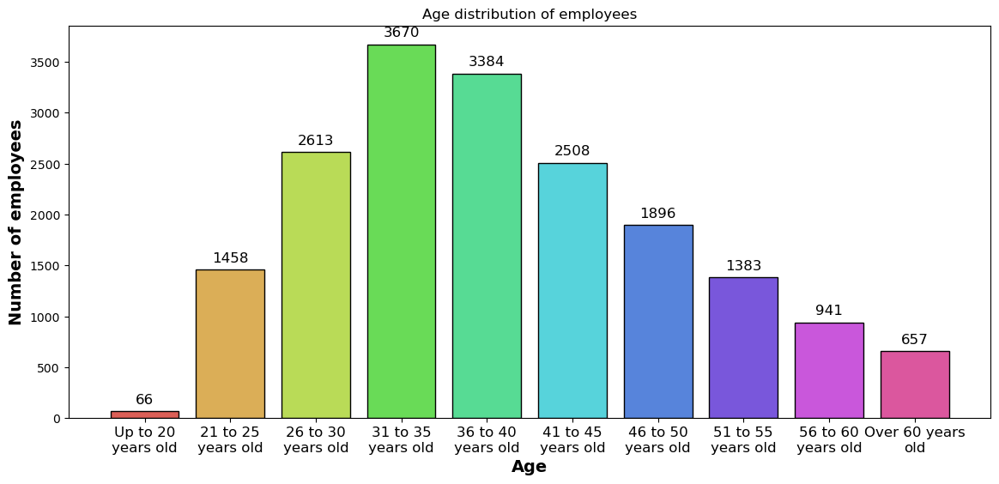

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define your custom order
age_order = ['Up to 20 years old', '21 to 25 years old', '26 to 30 years old', 
             '31 to 35 years old', '36 to 40 years old', '41 to 45 years old', 
             '46 to 50 years old', '51 to 55 years old', '56 to 60 years old', 
             'Over 60 years old']

# Convert the 'Your age:' column to a categorical type with the defined order
df['Your age:'] = pd.Categorical(df['Your age:'], categories=age_order, ordered=True)

# Get value counts 
age_counts = df['Your age:'].value_counts().sort_index()

# Create a color palette
colors = sns.color_palette("hls", len(age_counts))

plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Age distribution of employees with color for each bar and thin black outline.
bars = plt.bar(age_counts.index, age_counts.values, color=colors, edgecolor='black')

plt.title('Age distribution of employees')

# Add employee count on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 50, str(yval), ha='center', va='bottom', fontsize=12)

plt.xlabel('Age', fontsize=14, fontweight='bold')
plt.ylabel('Number of employees', fontsize=14, fontweight='bold')

# Divide labels into two lines
age_labels = ['\n'.join([' '.join(label.split()[:3]), ' '.join(label.split()[3:])]) for label in age_counts.index]
plt.xticks(range(len(age_counts.index)), age_labels, fontsize=12)

plt.tight_layout(pad=2.0)  # Increase the spacing between bars
# plt.savefig('employee_age_distribution.png', dpi=1800) 
plt.show()

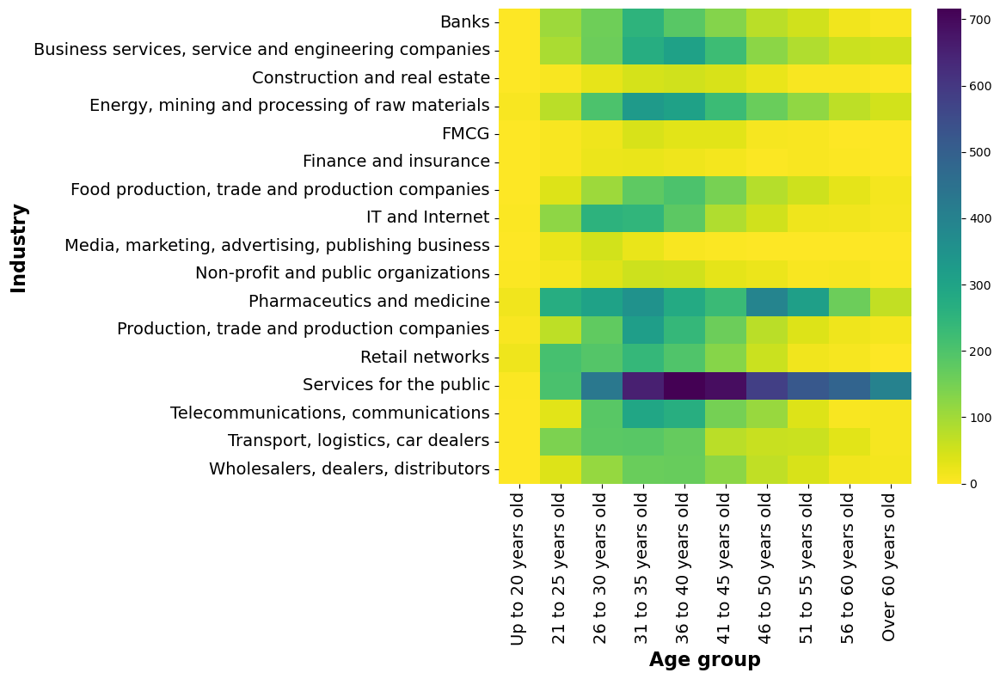

In [7]:
import textwrap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))  # Increase the figure size

# Group by 'Industry' and 'Your age:', then count the number of employees in each category
df_grouped = df.groupby(['Industry', 'Your age:']).size().reset_index(name='Count')

# Pivot the DataFrame to prepare for the heatmap
pivot_table = df_grouped.pivot(index='Industry', columns='Your age:', values='Count').fillna(0)

# Adjust the labels of the age groups
age_labels = [label.replace(' ', '\n') for label in pivot_table.columns]

wrapped_labels = [textwrap.fill(label, 10) for label in age_labels]
plt.gca().set_xticks(plt.gca().get_xticks() + 0.1)

# Increase the font size
plt.xticks(range(len(pivot_table.columns)), wrapped_labels, fontsize=14, rotation=0, ha='center', multialignment='center')
plt.yticks(fontsize=14)

# Create the heatmap
sns.heatmap(pivot_table, cmap='viridis_r', linecolor='black')

plt.xlabel('Age group', fontweight='bold', fontsize=16)
plt.ylabel('Industry', fontweight='bold', fontsize=16)
plt.tight_layout()
# plt.savefig('Number of employees in each industry and age group.png', dpi=1800) 
plt.show()


In [8]:
import plotly.express as px
import plotly.io as pio

# Count the number of employees in each industry
industry_counts = df['Industry'].value_counts()

# Calculate percentages
industry_percents = 100. * industry_counts / industry_counts.sum()

# Generate a DataFrame for Plotly
df_pie = pd.DataFrame({'Industry': industry_counts.index, 'Total': industry_counts, 'Percentage': industry_percents})

# Create labels by combining 'Industry', 'Total' and 'Percentage'
df_pie['Label'] = '<b>' + df_pie['Industry'] + ': ' + df_pie['Total'].astype(str) + ' employees (' + df_pie['Percentage'].round(2).astype(str) + '%)</b>'


# Create the plot
fig = px.pie(df_pie, names='Label', values='Total', hole=0.01)

# Adjust the position of the legend and reduce margin
fig.update_layout(
    height=1200,  # Increase the height
    width=1100,  # Increase the width
    legend=dict(font_family="Times New Roman",
        orientation="v",
        yanchor="bottom",
        y=0.15,
        xanchor="left",
        x=1.2,
        font=dict(
            size=16,  # Adjust legend font size here
            color='black',
        )
    ),
    margin=dict(
        t=2,  # Adjust top margin here
    )
)


# Show the plot
fig.show()

# Save the figure as a high-resolution PNG
width = 1000  # Adjust the desired width here
height = 600  # Adjust the desired height here
# pio.write_image(fig, 'Employees_by_Industry.png', width=width, height=height, scale=20)


# 2. Work Satisfaction and Engagement Analysis:

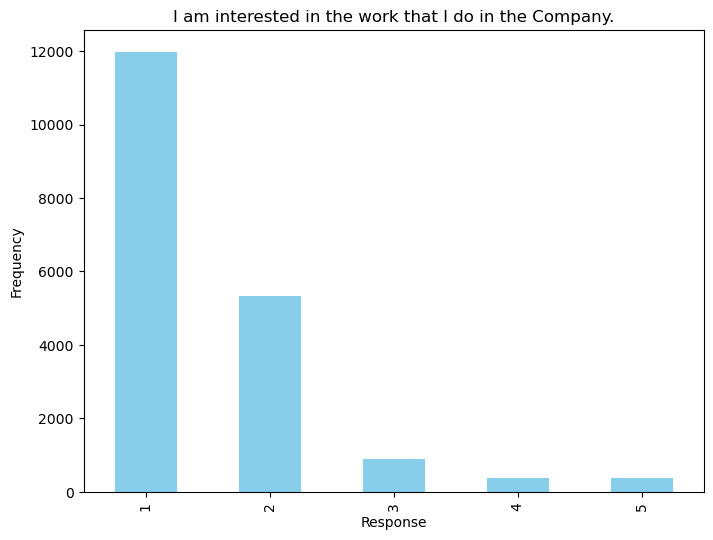

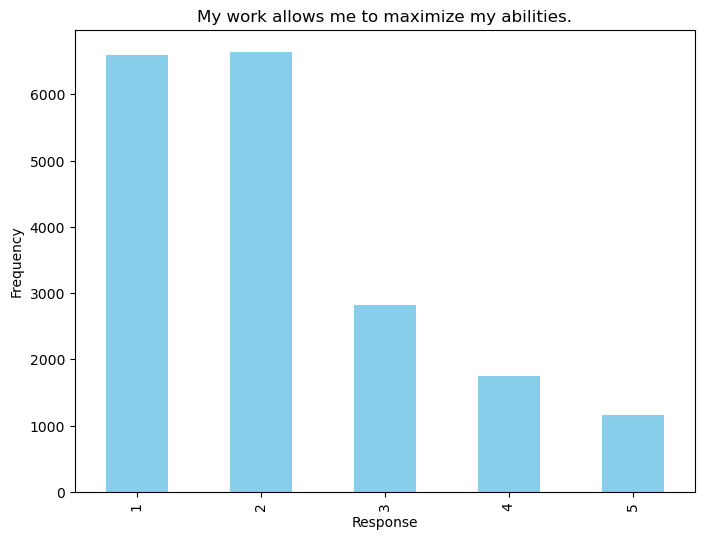

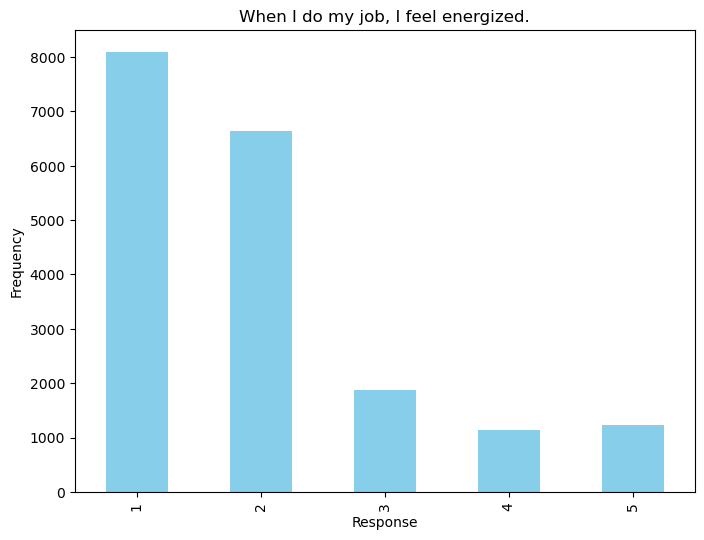

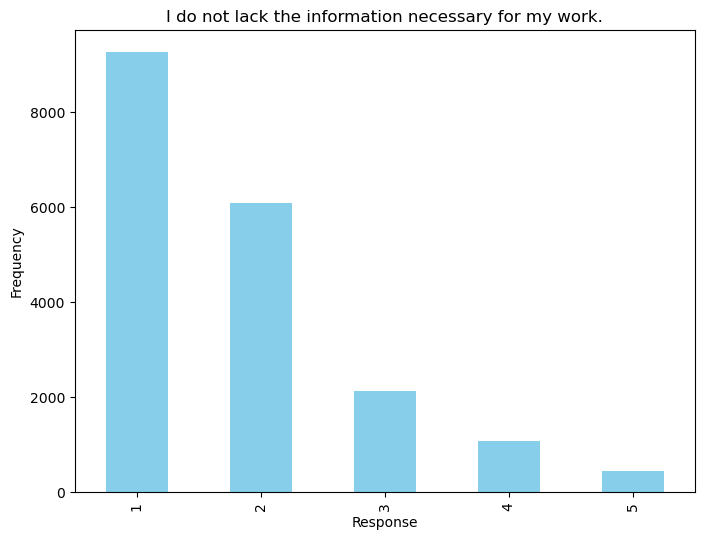

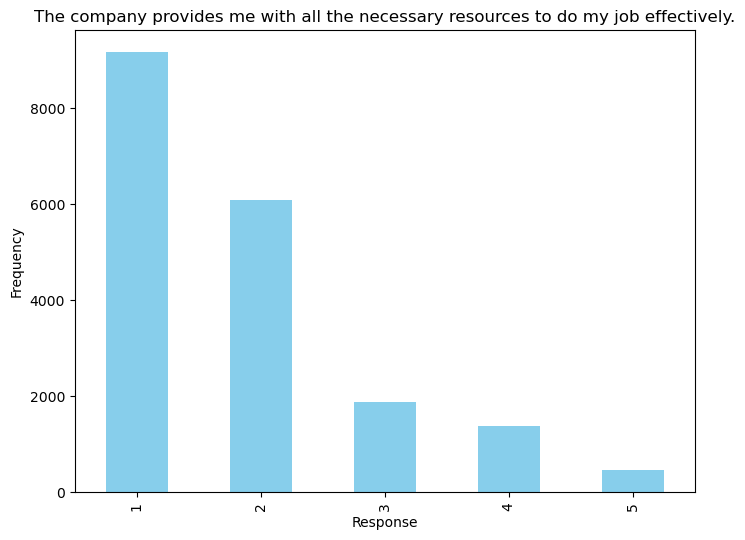

...

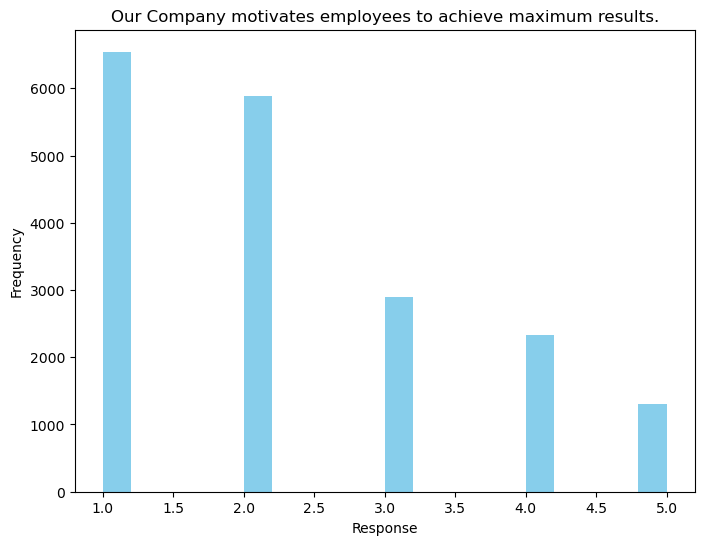

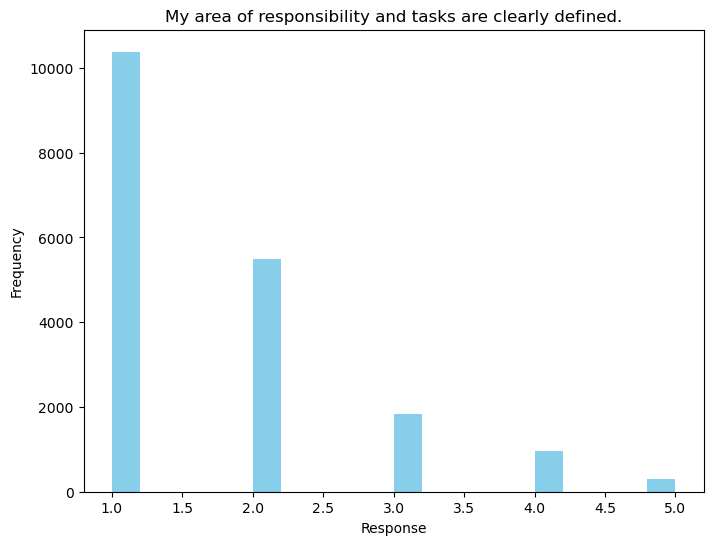

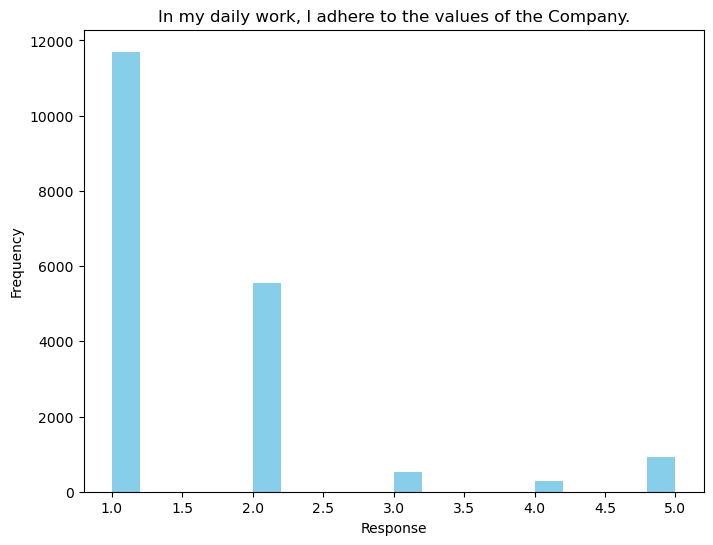

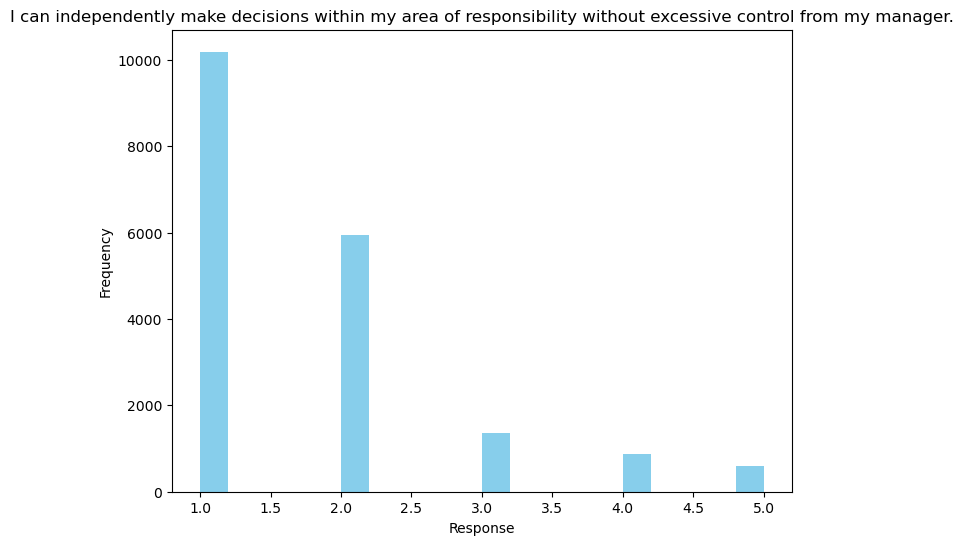

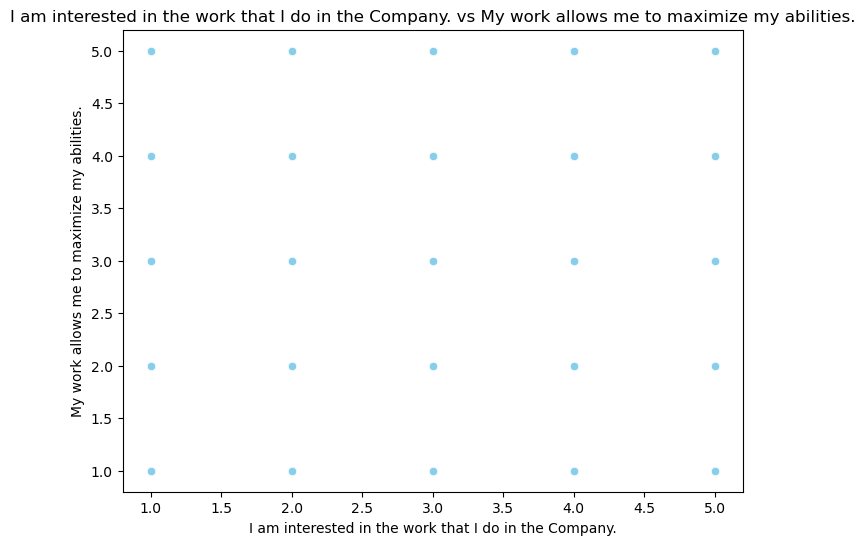

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df is your DataFrame

# Specify columns of interest
columns_of_interest = [
    "I am interested in the work that I do in the Company.",
    "My work allows me to maximize my abilities.",
    "When I do my job, I feel energized.",
    "I do not lack the information necessary for my work.",
    "The company provides me with all the necessary resources to do my job effectively.",
    "I get enough recognition and praise when I do my job well.",
    "Our Company motivates employees to achieve maximum results.",
    "My area of responsibility and tasks are clearly defined.",
    "In my daily work, I adhere to the values of the Company.",
    "I can independently make decisions within my area of responsibility without excessive control from my manager."
]

# Replace categorical responses with numerical values
for column in columns_of_interest:
    df[column].replace({
        'Agree': 1, 
        'Rather agree than disagree': 2,
        'Disagree rather than agree': 3,
        'Disagree': 4,
        'Difficult to answer': 5
    }, inplace=True)

# Plotting bar charts for each question
for column in columns_of_interest:
    plt.figure(figsize=(8,6))
    df[column].value_counts().sort_index().plot(kind='bar', color='skyblue')
    plt.title(column)
    plt.xlabel('Response')
    plt.ylabel('Frequency')
    plt.show()

# Plotting boxplots for each question
for column in columns_of_interest:
    plt.figure(figsize=(8,6))
    sns.boxplot(y=df[column], color='skyblue')
    plt.title(column)
    plt.show()

# Plotting a correlation heatmap
df_interest = df[columns_of_interest]
plt.figure(figsize=(10,8))
sns.heatmap(df_interest.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

# Plotting pie charts for each question
for column in columns_of_interest:
    plt.figure(figsize=(8,6))
    df[column].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title(column)
    plt.show()

# Plotting histograms for each question
for column in columns_of_interest:
    plt.figure(figsize=(8,6))
    df[column].plot(kind='hist', bins=20, color='skyblue')
    plt.title(column)
    plt.xlabel('Response')
    plt.show()

# Plotting scatter plots for each pair of questions
# Here we're choosing first and second question for demonstration
plt.figure(figsize=(8,6))
sns.scatterplot(x=df[columns_of_interest[0]], y=df[columns_of_interest[1]], color='skyblue')
plt.title(f'{columns_of_interest[0]} vs {columns_of_interest[1]}')
plt.show()


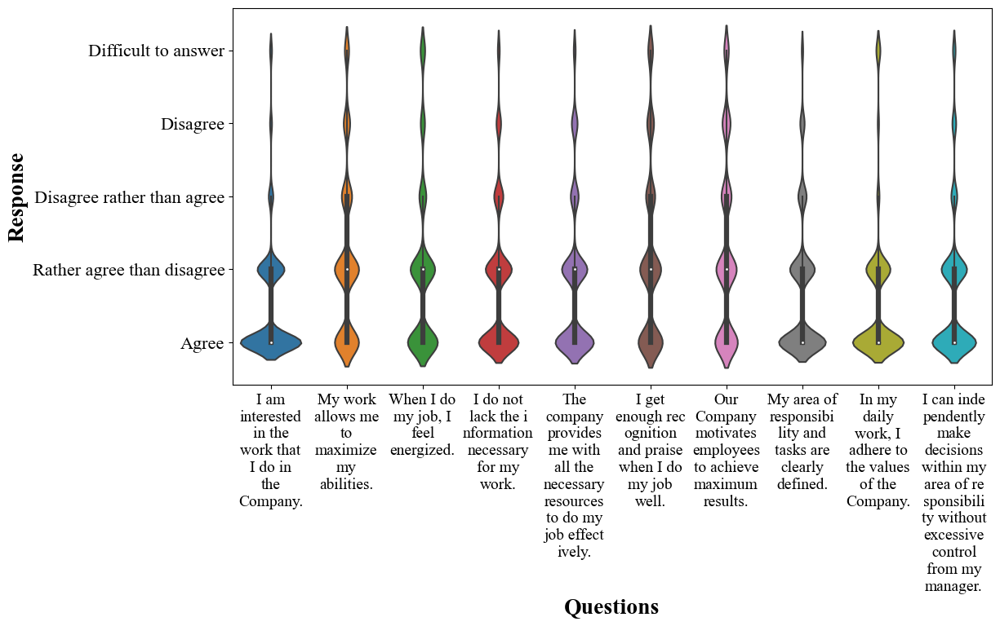

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import textwrap
import matplotlib as mpl

# Set the default font family to "Times New Roman"
mpl.rcParams['font.family'] = 'Times New Roman'

# Melt the dataset into a long format so we can use seaborn's violinplot
data_melted = pd.melt(df[columns_of_interest], var_name='Question', value_name='Response')

# Plot the violinplot
plt.figure(figsize=(12,6))

# Corrected y-axis labels
response_mapping = {
    'Agree': 1,
    'Rather agree than disagree': 2,
    'Disagree rather than agree': 3,
    'Disagree': 4,
    'Difficult to answer': 5
}

# Apply the mapping to the 'Response' column
# data_melted['Response'] = data_melted['Response'].map(response_mapping)

# Now continue with your plotting code
sns.violinplot(data=data_melted, x='Question', y='Response')
plt.yticks(range(1, 6), response_mapping.keys(), fontsize=16)  # Increase font size of y-ticks

# Set x-axis labels to fit with 2-3 line divisions with 0 rotation
x_labels = ['\n'.join(textwrap.wrap(label.get_text(), 10)) for label in plt.gca().get_xticklabels()]
plt.gca().set_xticklabels(x_labels, fontsize=14)  # Increase font size of x-ticks

# Set font properties for axes labels
plt.xlabel('Questions', fontweight='bold',fontsize=20)  # Increase font size of x-axis label
plt.ylabel('Response',fontweight='bold' ,fontsize=20)  # Increase font size of y-axis label

# plt.savefig('Work satisfaction analysis.png', dpi=1800,bbox_inches='tight')
plt.show()


# 3. Work Environment Analysis:

In [12]:
import pandas as pd
import plotly.graph_objects as go
from math import cos, sin, pi

def insert_line_breaks(string, length):
    if len(string) <= length:
        return string
    else:
        # Find the nearest space to the desired length
        break_index = string.rfind(' ', 0, length)
        # If no space is found, just insert a line break at the desired length
        if break_index == -1:
            break_index = length
        # Return the string with a line break inserted
        return string[:break_index] + '<br>' + insert_line_breaks(string[break_index:], length)

columns_of_interest = [
    "In our Company, the work is organized efficiently and optimally regulated.",
    "The company provides me with all the necessary resources to do my job effectively.",
    "In the Company, I get enough opportunities for training and professional development.",
    "Our Company provides comfortable working conditions (salary and social package) for its employees.",
    "In our Company, there are friendly and positive relations between employees.",
    "My manager supports the suggestions of employees to optimize work and helps to implement them.",
    "Top management clearly explains the Company's strategy and goals and how to achieve them.",
    "Friendly and positive relations have been established between the various divisions of our Company.",
    "In our team, there are friendly and positive relations between employees."
]

responses = ["Agree", "Rather agree than disagree", "Disagree rather than agree", "Disagree", "Difficult to answer"]

# Initialize figure
fig = go.Figure()

max_response_count = 0  # Initialize max_response_count

columns_with_line_breaks = [insert_line_breaks(column, 30) for column in columns_of_interest]

# For each response, create a radar plot
for response in responses:
    response_counts = []
    columns_with_responses = []  # Keep track of columns that have at least one response
    for column in columns_of_interest:
        response_count = (df[column] == response).sum()  # Count occurrences of each response
        if response_count > 0:  # Only add columns that have at least one response
            response_counts.append(response_count)
            columns_with_responses.append(column)
            # Update max_response_count if current count is higher
            if response_count > max_response_count:
                max_response_count = response_count

    fig.add_trace(go.Scatterpolar(
        r=response_counts,
        theta=columns_with_line_breaks,
        fill='toself',
        name=response
    ))

# Adjust layout
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, max_response_count]
        )),
    showlegend=True
)

# Add response labels outside the plot
for response, column in zip(responses, columns_with_line_breaks):
    label = response
    theta = columns_with_line_breaks.index(column)  # Change here
    r = max_response_count + 1  # Adjust the distance from the plot

    fig.add_annotation(
        x=r * 22.1 * cos(theta * 2 * pi / len(columns_with_line_breaks)),  # And here
        y=r * 2.1 * sin(theta * 2 * pi / len(columns_with_line_breaks)),  # And here
        text=label,
        showarrow=False
    )

filename = "radar_plot.png"
# pio.write_image(fig, filename, format="png", width=1000, height=600, scale=10)

print(f"Figure saved as {filename}")

fig.show()


Figure saved as radar_plot.png


# 4. Word cloud of 

**What do you think makes our company a good employer?**

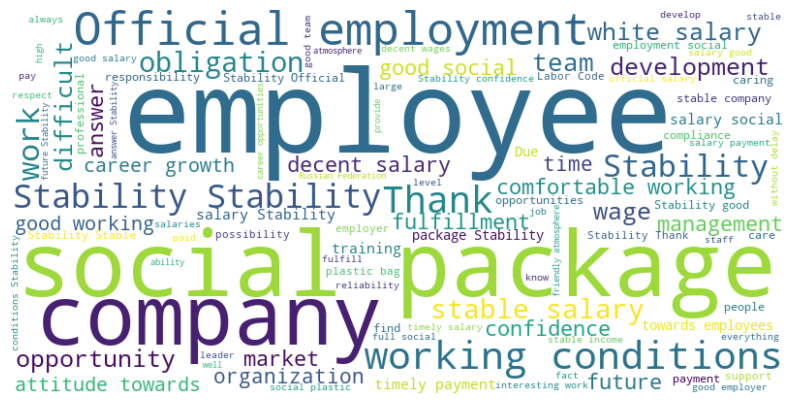

In [13]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Convert the column values to strings and concatenate them
text1 = ' '.join(df["What do you think makes our company a good employer?"].astype(str))

# Create a WordCloud object
wordcloud1 = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(text1)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis('off')
plt.show()


**What do you think should be improved in the work/processes in the company?**

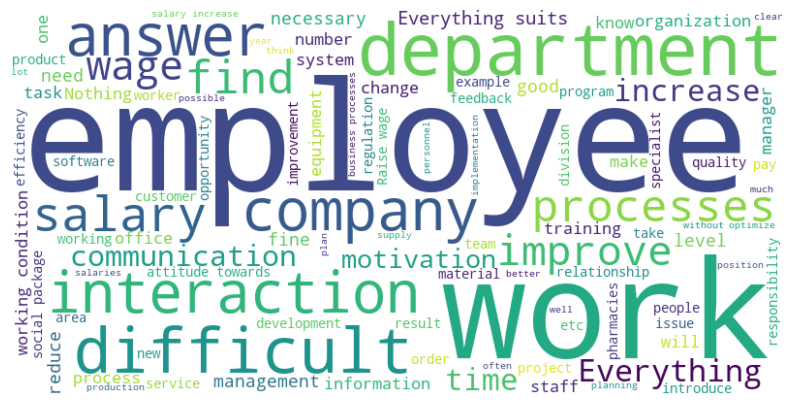

In [14]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Convert the column values to strings and concatenate them
text2 = ' '.join(df["What do you think should be improved in the work/processes in the company?"].astype(str))

# Create a WordCloud object
wordcloud2 = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(text2)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis('off')
plt.show()


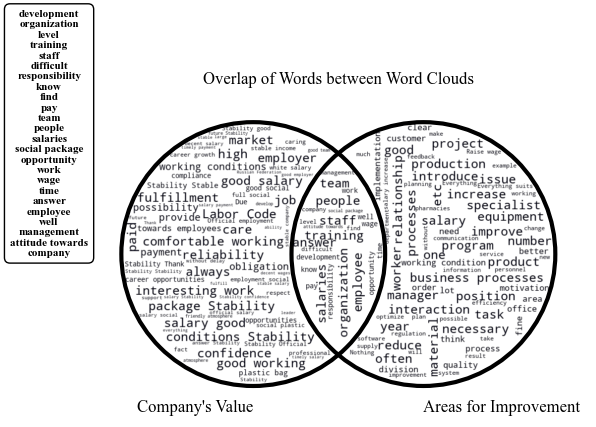

In [15]:
from matplotlib_venn_wordcloud import venn2_wordcloud
from matplotlib_venn_wordcloud import venn2_wordcloud
import matplotlib.pyplot as plt

# Get the unique words from each word cloud
unique_words1 = set(wordcloud1.words_.keys())
unique_words2 = set(wordcloud2.words_.keys())

# Find the overlapping words
overlap_words = unique_words1.intersection(unique_words2)

# Create the Venn diagram
venn = venn2_wordcloud([unique_words1, unique_words2], set_labels=("Company's Value", "Areas for Improvement"))

# Change the size of the text in the labels
for text in venn.set_labels:
    text.set_fontsize(12)
    
# Add the overlapping words as a label with a bounding box
plt.annotate('\n'.join(overlap_words), xy=(0.3, 0.3), xytext=(-30, -30),
             textcoords='offset points', ha='center', va='center',
             fontsize=8, fontweight='bold', color='black',
             bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.5'))

# Add a title
plt.title("Overlap of Words between Word Clouds")

# Show the plot
# plt.savefig('ovelap of words between word clouds.png', dpi=1800,bbox_inches='tight')
plt.show()


# Burnout Prediction

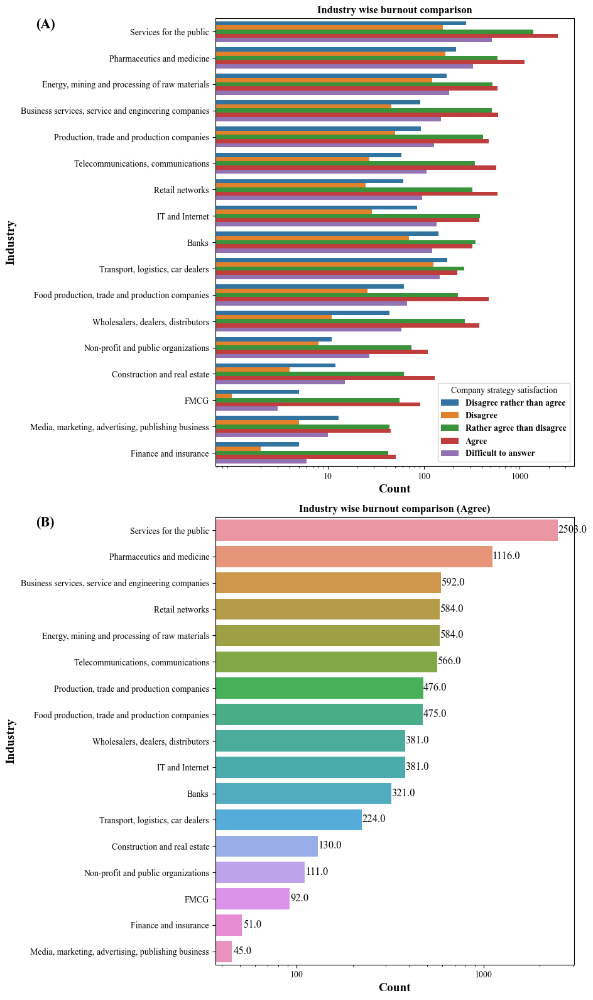

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

# Column mapping for ease of use
cols = {
    'I believe that our Company\'s strategy will lead it to success.': 'company_strategy',
    'I plan to leave the Company within the next year.': 'plan_to_leave',
    'Industry': 'industry'
}

df.rename(columns=cols, inplace=True)

# Creating a count plot to show industry wise burnout comparison with customized x-axis scale
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 16))

# Figure A
sns.countplot(y='industry', hue='company_strategy', data=df, order=df['industry'].value_counts().index, ax=axs[0])
axs[0].set_title('Industry wise burnout comparison', fontweight='bold', fontsize=12)
axs[0].set_xlabel('Count', fontweight='bold', fontsize=14)
axs[0].set_xscale('log')
axs[0].set_ylabel('Industry', fontweight='bold', fontsize=14)
axs[0].xaxis.set_major_locator(ticker.FixedLocator([10, 100, 1000]))
axs[0].xaxis.set_major_formatter(ticker.ScalarFormatter())
legend_a = axs[0].legend(title='Company strategy satisfaction', title_fontsize=10)
for text in legend_a.get_texts():
    text.set_fontweight('bold')
    text.set_fontsize(10)
axs[0].tick_params(axis='both', labelsize=10)
axs[0].text(-.5, 1.0, '(A)', transform=axs[0].transAxes, fontsize=16, fontweight='bold', va='top')

# Filter the dataframe to include only 'Agree' category
filtered_df = df[df['company_strategy'] == 'Agree']

# Figure B
sns.countplot(y='industry', data=filtered_df, order=filtered_df['industry'].value_counts().index, ax=axs[1])
axs[1].set_title('Industry wise burnout comparison (Agree)', fontweight='bold', fontsize=12)
axs[1].set_xlabel('Count', fontweight='bold', fontsize=14)
axs[1].set_xscale('log')
axs[1].set_ylabel('Industry', fontweight='bold', fontsize=14)
axs[1].xaxis.set_major_locator(ticker.FixedLocator([10, 100, 1000]))
axs[1].xaxis.set_major_formatter(ticker.ScalarFormatter())
axs[1].tick_params(axis='both', labelsize=10)
axs[1].text(-.5, 1.0, '(B)', transform=axs[1].transAxes, fontsize=16, fontweight='bold', va='top')

# Add total count at the end of each bar in Figure B
for p in axs[1].patches:
    count = p.get_width()
    x_pos = p.get_x() + p.get_width() + 1
    y_pos = p.get_y() + p.get_height() / 2
    axs[1].text(x_pos, y_pos, count, ha='left', va='center', fontsize=12)

# Save the combined figure
plt.tight_layout()
# plt.savefig('combined_figure.png', dpi=1800)
plt.show()


# Response clustering

In [17]:
df = pd.read_csv('final_filtered_data.csv')
df = df.drop(df.index[0])

C:\Users\Kishan Bhimani\AppData\Local\Temp\ipykernel_6872\777669022.py:1: DtypeWarning:

Columns (4,14,15,16,17,90,93,94,95) have mixed types. Specify dtype option on import or set low_memory=False.



In [18]:
df = df.iloc[:, 18:78]

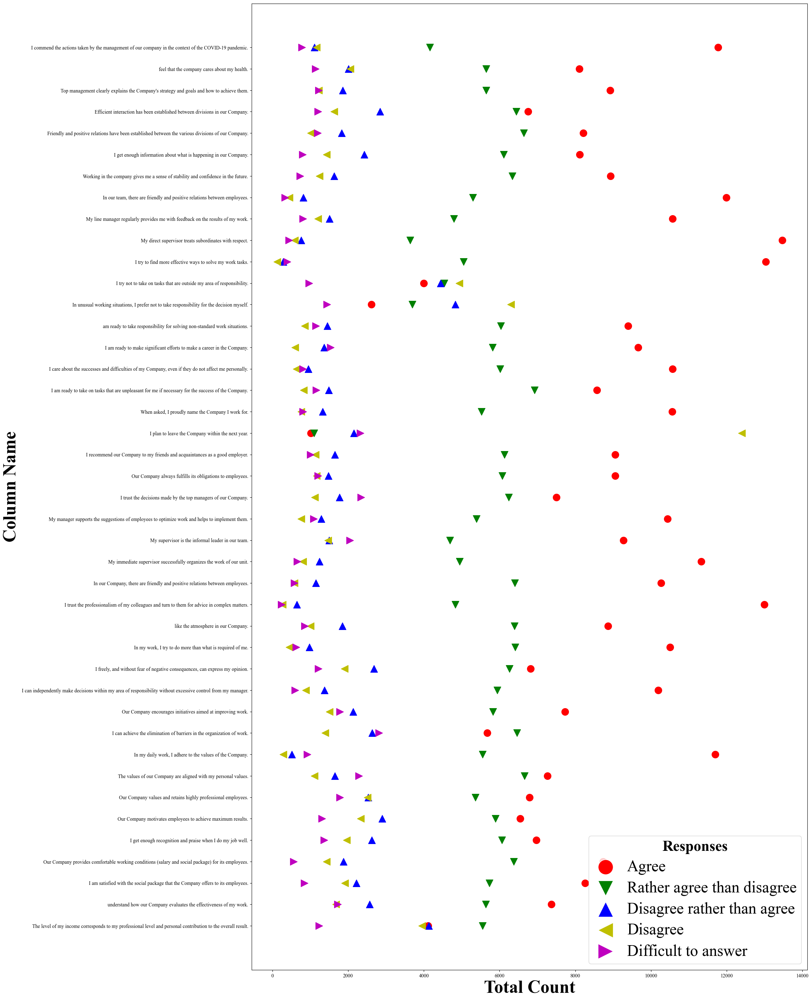

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.font_manager import FontProperties

# assuming df is your DataFrame
df = df.iloc[:, 18:78]

# define responses
responses = [
    'Agree',
    'Rather agree than disagree',
    'Disagree rather than agree',
    'Disagree',
    'Difficult to answer'
]

# count responses for each column
counts = {col: df[col].value_counts() for col in df.columns}

# prepare for scatter plot
cols = df.columns
markers = ['o', 'v', '^', '<', '>']
colors = ['r', 'g', 'b', 'y', 'm']

# Specify font properties
font = FontProperties()
font.set_family('serif')
font.set_name('Times New Roman')
font.set_style('normal')

# plot
fig, ax = plt.subplots(figsize=(20, 35))

for i, response in enumerate(responses):
    counts_response = [counts[col].get(response, 0) for col in cols]
    ax.scatter(counts_response, cols, marker=markers[i], color=colors[i], label=response, s=200)  # increased marker size with 's' parameter

# rotate y-axis labels and increase their size
plt.yticks(rotation=0, fontsize=28, fontproperties=font)

# increase x-axis labels size
plt.xticks(fontsize=34, fontproperties=font)

# legend and labels with increased size
legend_elements = [Line2D([0], [0], marker=markers[i], color='w', label=responses[i], markerfacecolor=colors[i], markersize=30) for i in range(len(responses))]
legend = ax.legend(handles=legend_elements, title="Responses", prop={'size': 28})
legend.get_title().set_fontproperties(font)
legend.set_title(legend.get_title().get_text(), prop={'size': 30, 'weight': 'bold'})

for text in legend.get_texts():
    text.set_fontproperties(font)
    text.set_fontsize(32)

ax.set_xlabel('Total Count', fontsize=36, fontproperties=font, fontweight='bold')
ax.set_ylabel('Column Name', fontsize=36, fontproperties=font, fontweight='bold')
# plt.savefig('response_cluster_1.png', dpi=300,bbox_inches='tight')
plt.show()


# Auxilliary 

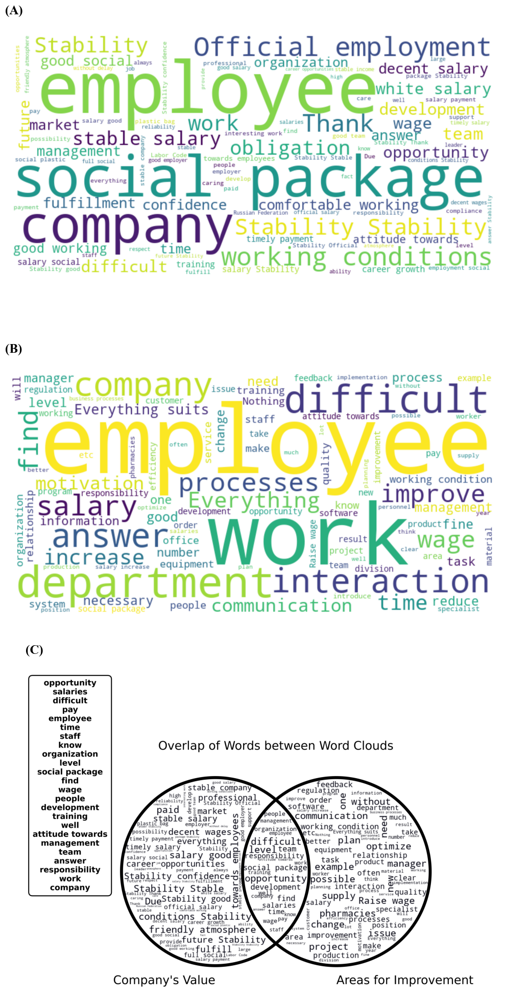

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img_A = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/companys value by good employer.png')
img_B = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/areas for improvement.png')
img_C = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/ovelap of words between word clouds.png')

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 20))

# Plot each image on a separate subplot and add a label
axs[0].imshow(img_A)
axs[0].text(0, 1.05, "(A)", transform=axs[0].transAxes, fontsize=18, fontweight='bold', va='bottom')
axs[0].axis('off')

axs[1].imshow(img_B)
axs[1].text(0, 1.05, "(B)", transform=axs[1].transAxes, fontsize=18, fontweight='bold', va='bottom')
axs[1].axis('off')

axs[2].imshow(img_C)
axs[2].text(0, 1.05, "(C)", transform=axs[2].transAxes, fontsize=18, fontweight='bold', va='bottom')
axs[2].axis('off')

# Save the resulting figure
plt.tight_layout()
# plt.savefig('Figure_A_B_C_word_cloud', dpi=1800,bbox_inches='tight')
plt.show()


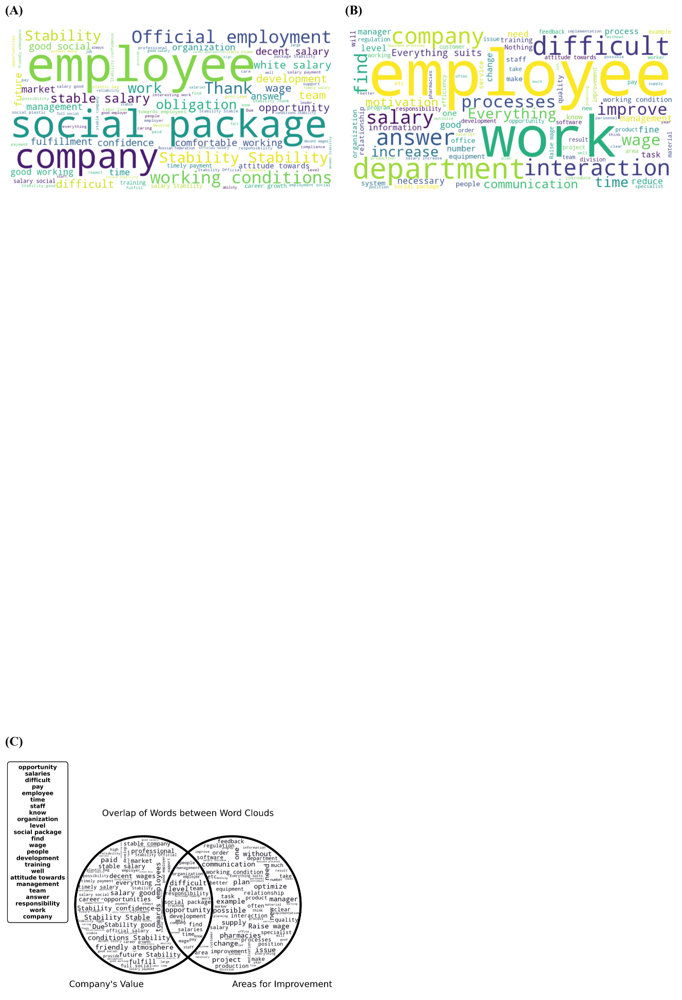

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.gridspec import GridSpec

# Load the images
img_A = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/companys value by good employer.png')
img_B = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/areas for improvement.png')
img_C = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/ovelap of words between word clouds.png')

# Create a gridspec
fig = plt.figure(figsize=(20, 30))  # Adjust the size based on your requirements
gs = GridSpec(2, 3, figure=fig)  # 2 rows and 3 columns

# Add subplots
ax1 = fig.add_subplot(gs[0, 0])  # 1st row, 1st column
ax2 = fig.add_subplot(gs[0, 1:2])  # 1st row, 2nd and 3rd column
ax3 = fig.add_subplot(gs[1, 0])  # 2nd row, 2nd column

# Plot each image on a separate subplot and add a label
ax1.imshow(img_A)
ax1.text(0, 1.05, "(A)", transform=ax1.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax1.axis('off')

ax2.imshow(img_B)
ax2.text(0, 1.05, "(B)", transform=ax2.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax2.axis('off')

ax3.imshow(img_C)
ax3.text(0, 1.05, "(C)", transform=ax3.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax3.axis('off')

# Save the resulting figure
plt.tight_layout()
# plt.savefig('Figure_A_B_C_word_cloud', dpi=1800,bbox_inches='tight')
plt.show()


C:\Users\Kishan Bhimani\AppData\Local\Temp\ipykernel_6872\1130350542.py:33: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



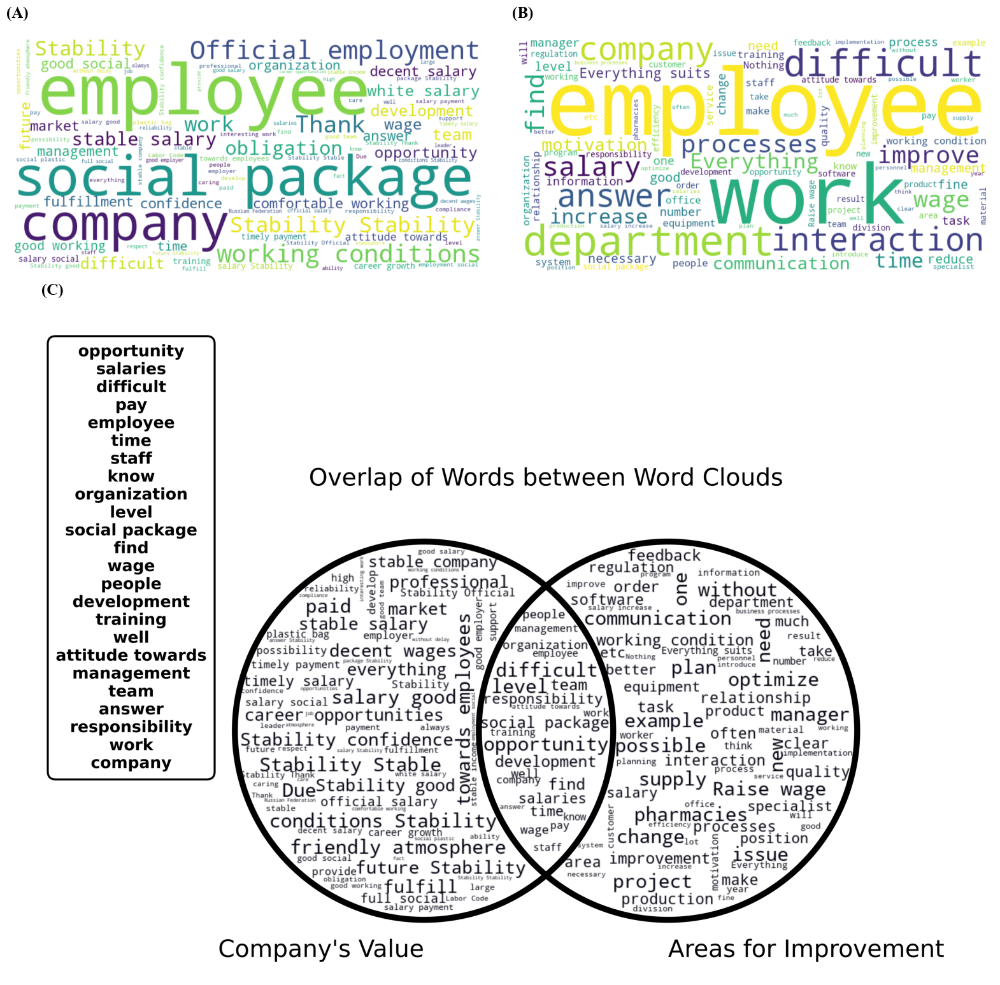

In [22]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.gridspec import GridSpec

# Load the images
img_A = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/companys value by good employer.png')
img_B = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/areas for improvement.png')
img_C = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/ovelap of words between word clouds.png')

# Create a gridspec
fig = plt.figure(figsize=(20, 20))  # Adjust the size based on your requirements
gs = GridSpec(3, 2, figure=fig, hspace=0.05, wspace=0.05)  # 3 rows and 2 columns, adjust hspace and wspace

# Add subplots
ax1 = fig.add_subplot(gs[0, 0])  # 1st row, 1st column
ax2 = fig.add_subplot(gs[0, 1])  # 1st row, 2nd column
ax3 = fig.add_subplot(gs[1:, :])  # 2nd and 3rd row, all columns

# Plot each image on a separate subplot and add a label
ax1.imshow(img_A)
ax1.text(0, 1.05, "(A)", transform=ax1.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax1.axis('off')

ax2.imshow(img_B)
ax2.text(0, 1.05, "(B)", transform=ax2.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax2.axis('off')

ax3.imshow(img_C)
ax3.text(0, 1.05, "(C)", transform=ax3.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax3.axis('off')

# Save the resulting figure
plt.tight_layout()
# plt.savefig('Figure_A_B_C_word_cloud', dpi=1800,bbox_inches='tight')
plt.show()


C:\Users\Kishan Bhimani\AppData\Local\Temp\ipykernel_6872\3666808918.py:33: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



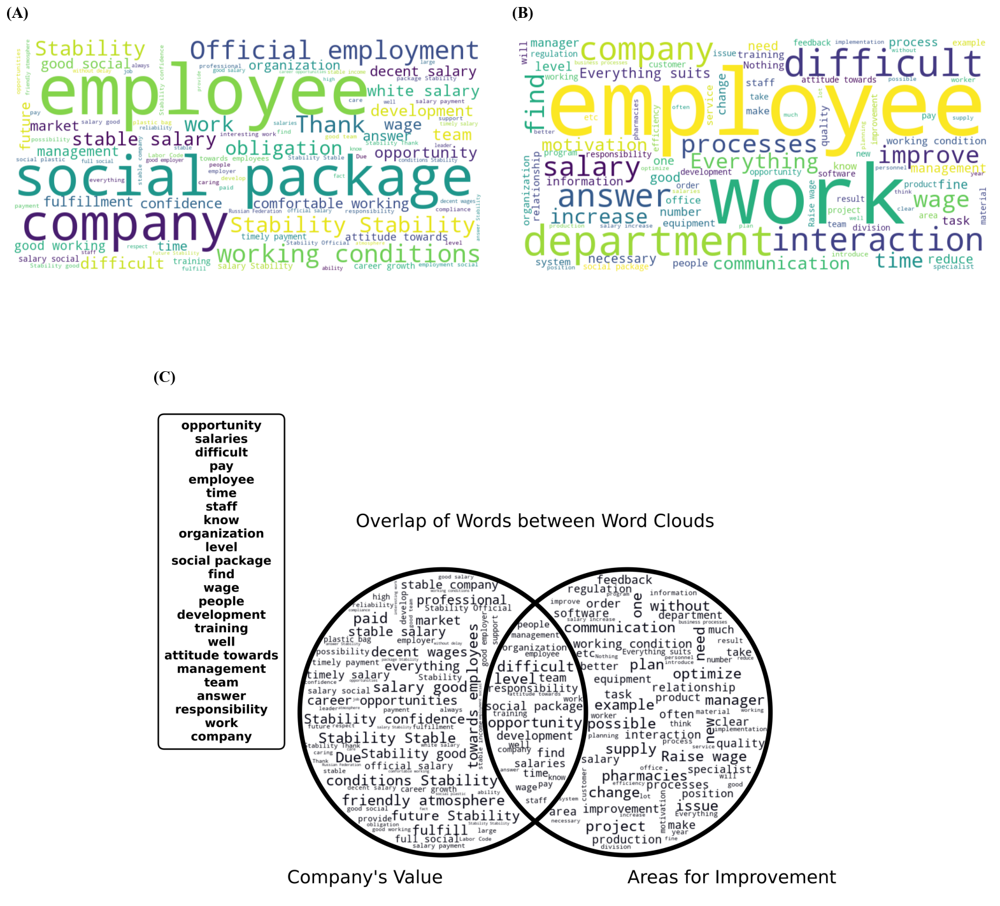

In [23]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.gridspec import GridSpec

# Load the images
img_A = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/companys value by good employer.png')
img_B = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/areas for improvement.png')
img_C = mpimg.imread('C:/Users/Kishan Bhimani/Downloads/Papers_pub/DAMDID_2023_HSE/Final_Paper/Images/ovelap of words between word clouds.png')

# Create a gridspec
fig = plt.figure(figsize=(20, 20))  # Adjust the size based on your requirements
gs = GridSpec(3, 2, figure=fig, height_ratios=[2, 1, 1], hspace=0.05, wspace=0.05)  # adjust the height ratios

# Add subplots
ax1 = fig.add_subplot(gs[0, 0])  # 1st row, 1st column
ax2 = fig.add_subplot(gs[0, 1])  # 1st row, 2nd column
ax3 = fig.add_subplot(gs[1:, :])  # 2nd and 3rd row, all columns

# Plot each image on a separate subplot and add a label
ax1.imshow(img_A)
ax1.text(0, 1.05, "(A)", transform=ax1.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax1.axis('off')

ax2.imshow(img_B)
ax2.text(0, 1.05, "(B)", transform=ax2.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax2.axis('off')

ax3.imshow(img_C)
ax3.text(0, 1.05, "(C)", transform=ax3.transAxes, fontsize=18, fontweight='bold', va='bottom')
ax3.axis('off')

# Save the resulting figure
plt.tight_layout()
# plt.savefig('Figure_A_B_C_word_cloud', dpi=1800,bbox_inches='tight')
plt.show()
